In [35]:
import numpy as np
import pandas as pd
import seaborn as sn
from sklearn import linear_model as lm
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import *

In [36]:
train = pd.read_csv("data/loans_train_data.csv")
test = pd.read_csv("data/loans_test_data.csv")

In [37]:
train.head()

,emp_title,emp_length,state,homeownership,annual_income,verified_income,debt_to_income,annual_income_joint,verification_income_joint,debt_to_income_joint,...,tax_liens,public_record_bankrupt,loan_purpose,application_type,loan_amount,term,interest_rate,initial_listing_status,disbursement_method,id
0,instructor,2.0,NY,RENT,45000.0,Source Verified,6.71,NaN,NaN,NaN,...,0,0,debt_consolidation,individual,12000,60,19.03,whole,Cash,1
1,owner,10.0,CA,RENT,68000.0,Source Verified,18.99,NaN,NaN,NaN,...,0,1,small_business,individual,7200,36,16.01,whole,Cash,2
2,merchandiser,10.0,TN,OWN,15000.0,Source Verified,20.83,NaN,NaN,NaN,...,0,0,credit_card,individual,5000,36,11.99,whole,Cash,3
3,deputy clerk,2.0,OH,MORTGAGE,35000.0,Verified,35.56,NaN,NaN,NaN,...,0,0,debt_consolidation,individual,12800,60,23.88,whole,DirectPay,4
4,teacher,2.0,UT,RENT,34000.0,Not Verified,13.20,NaN,NaN,NaN,...,0,0,credit_card,individual,1200,36,10.90,whole,Cash,5


In [10]:
sn.pairplot(train)

In [6]:
train.describe()

,emp_length,annual_income,debt_to_income,annual_income_joint,debt_to_income_joint,delinq_2y,months_since_last_delinq,earliest_credit_line,inquiries_last_12m,total_credit_lines,...,num_open_cc_accounts,num_cc_carrying_balance,num_mort_accounts,account_never_delinq_percent,tax_liens,public_record_bankrupt,loan_amount,term,interest_rate,id
count,6443.000000,7.000000e+03,6986.000000,1059.000000,1059.000000,7000.000000,3060.000000,7000.000000,7000.000000,7000.000000,...,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.00000,7000.000000
mean,5.939159,7.949433e+04,19.261134,129198.038886,19.868687,0.218000,36.982026,2001.245714,1.961286,22.628286,...,8.073857,5.203857,1.378000,94.515414,0.044857,0.126000,16354.142857,43.241143,12.47482,3500.500000
std,3.718397,6.634772e+04,14.486939,68403.158182,8.112970,0.683875,21.707648,7.805605,2.404231,11.907816,...,4.855489,3.259727,1.700786,9.290584,0.681635,0.338691,10317.557647,11.016833,5.01296,2020.870275
min,0.000000,0.000000e+00,0.000000,19200.000000,0.320000,0.000000,1.000000,1963.000000,0.000000,2.000000,...,0.000000,0.000000,0.000000,14.300000,0.000000,0.000000,1000.000000,36.000000,5.31000,1.000000
25%,2.000000,4.500000e+04,11.050000,87000.000000,13.945000,0.000000,19.000000,1997.000000,0.000000,14.000000,...,5.000000,3.000000,0.000000,92.300000,0.000000,0.000000,8293.750000,36.000000,9.43000,1750.750000
50%,6.000000,6.500000e+04,17.540000,115000.000000,19.560000,0.000000,34.000000,2003.000000,1.000000,21.000000,...,7.000000,5.000000,1.000000,100.000000,0.000000,0.000000,14400.000000,36.000000,11.98000,3500.500000
75%,10.000000,9.500000e+04,25.007500,155000.000000,25.360000,0.000000,53.000000,2006.000000,3.000000,29.000000,...,10.000000,7.000000,2.000000,100.000000,0.000000,0.000000,24000.000000,60.000000,15.05000,5250.250000
max,10.000000,2.300000e+06,469.090000,690000.000000,39.980000,13.000000,109.000000,2015.000000,26.000000,87.000000,...,38.000000,29.000000,14.000000,100.000000,52.000000,3.000000,40000.000000,60.000000,30.94000,7000.000000


In [38]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7000 entries, 0 to 6999
Data columns (total 46 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   emp_title                         6431 non-null   object 
 1   emp_length                        6443 non-null   float64
 2   state                             7000 non-null   object 
 3   homeownership                     7000 non-null   object 
 4   annual_income                     7000 non-null   float64
 5   verified_income                   7000 non-null   object 
 6   debt_to_income                    6986 non-null   float64
 7   annual_income_joint               1059 non-null   float64
 8   verification_income_joint         1034 non-null   object 
 9   debt_to_income_joint              1059 non-null   float64
 10  delinq_2y                         7000 non-null   int64  
 11  months_since_last_delinq          3060 non-null   float64
 12  earlie

In [39]:
cov_train = train[['annual_income','num_cc_carrying_balance','debt_to_income','total_debit_limit','num_mort_accounts',
                   'account_never_delinq_percent','debt_to_income_joint','loan_amount','term','interest_rate']].corr()

<AxesSubplot:>

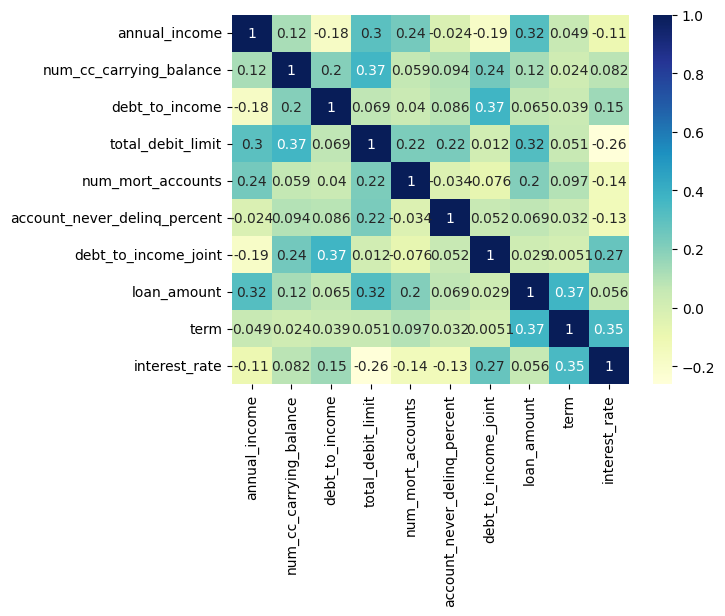

In [40]:
sn.heatmap(cov_train, cmap ="YlGnBu", annot = True)

In [41]:
train[['months_since_last_delinq', 'interest_rate']].corr()

,months_since_last_delinq,interest_rate
months_since_last_delinq,1.000000,-0.094109
interest_rate,-0.094109,1.000000


In [42]:
Y = train[['interest_rate']]

In [43]:
X = train.select_dtypes(['number'])

In [44]:
X.drop(['id', 'interest_rate', 'tax_liens', 'public_record_bankrupt', 'emp_length', 'num_accounts_30d_past_due',
       'num_accounts_120d_past_due', 'current_accounts_delinq',
       ], axis=1, inplace = True)

In [45]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

In [55]:
imp = SimpleImputer(strategy="most_frequent")
X_train = imp.fit_transform(X_train)
imp = SimpleImputer(strategy="most_frequent")
X_test = imp.fit_transform(X_test)
lr = lm.LinearRegression()
lr.fit(X_train,Y_train)

LinearRegression()

In [49]:
predictions = lr.predict(X_test)
predictionx = lr.predict(X_train)

In [51]:
predictions.shape

(1400, 1)

In [52]:
print('RMSE on training data: ', np.sqrt(mean_squared_error(Y_test, predictions)))

RMSE on training data:  4.395407080784127


In [56]:
ridge = lm.RidgeCV()
ridge.fit(X_train, Y_train)

RidgeCV()

In [57]:
testX = test.select_dtypes(['number'])
testX.drop(['id', 'tax_liens', 'public_record_bankrupt', 'emp_length', 'num_accounts_30d_past_due',
       'num_accounts_120d_past_due', 'current_accounts_delinq' ], axis=1, inplace = True)
imp = SimpleImputer(strategy="most_frequent")
testX = imp.fit_transform(testX)

In [58]:
train_predictions = ridge.predict(X)

test_predictions = ridge.predict(testX)

print('RMSE on training data: ', np.sqrt(mean_squared_error(Y, train_predictions)))

RMSE on training data:  4.141241927085646


In [170]:
train_predictions

array([[15.69237788],
       [10.47006521],
       [11.82120801],
       ...,
       [13.05323689],
       [ 6.15368097],
       [16.93498691]])